<h1>PEC 3 - Visualización de datos</h1>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
plt.style.use('fivethirtyeight')

%matplotlib inline

In [2]:
netflix = pd.read_csv("netflix_titles.csv")

In [3]:
netflix.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [4]:
fig = px.histogram(netflix, x="release_year",title="Cantidad de contenido publicado por año")
fig.show()

¿Qué duración suelen tener las películas?

In [5]:
movies = netflix[netflix["type"] == "Movie"].copy()
movies["duration"] = movies["duration"].astype(str)
movies["duration"] = movies["duration"].map(lambda x: x.replace("min", "")).str.strip()
movies= movies[movies.duration.apply(lambda x: x.isnumeric())]
movies["duration"] = movies["duration"].astype(int)

In [6]:
fig = px.histogram(movies,x = "duration", nbins = 90, title="Cantidad de películas según su duración")
fig.show()

In [7]:
fig = px.histogram(netflix,x="rating", color = "type", title= "Cantidad de series y películas según su clasificación")
fig.show()

In [18]:
most_common_countries = netflix.country.value_counts()[:10]
fig = px.bar(most_common_countries,x="country", color= "country", title= "Cantidad de películas y series por pais")
fig.update_yaxes(title_text='Country')
fig.show()

In [9]:
datadict = {}
for year in movies.release_year.unique() :
    moviesthisyear = movies.duration[movies["release_year"] == year]
    meanduration = ((moviesthisyear.sum())/moviesthisyear.count())
    datadict[year] = meanduration


In [10]:
durbyagedf = pd.DataFrame(datadict.items(), columns=['Year', 'Duration'])

Text(0.5, 1.0, 'Duración media de las películas según su año')

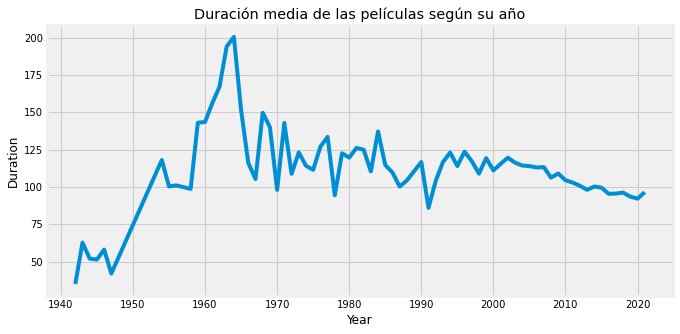

In [11]:
plt.figure(figsize = (10,5))
fig = sns.lineplot(data = durbyagedf, x = "Year", y = "Duration")
plt.title("Duración media de las películas según su año")


In [12]:
most_listed_genres = netflix.listed_in.value_counts()[:10]

In [13]:
fig = px.funnel(most_listed_genres,x="listed_in", color= "listed_in", title= "Cantidad de películas y series por género")
fig.update_yaxes(title_text='Genre')
fig.show()

In [14]:
post2000netflix = netflix[netflix.release_year >2000]

In [15]:
fig = px.violin(post2000netflix, y="release_year", x="type", color = "type", box=True, points="all", hover_data=netflix.columns, title = "Cantidad de películas y series publicadas por año")
fig.show()

In [16]:
datadict = {}
movies =  movies[movies.rating.isna()==False]
for rating in movies.rating.unique() :
    moviesrating = movies.duration[movies["rating"] == rating]
    meanduration = ((moviesrating.sum())/moviesrating.count())
    datadict[rating] = meanduration
durbyrating = pd.DataFrame(datadict.items(), columns=['Rating', 'Duration'])

Text(0.5, 1.0, 'Duración media de cada clasificación')

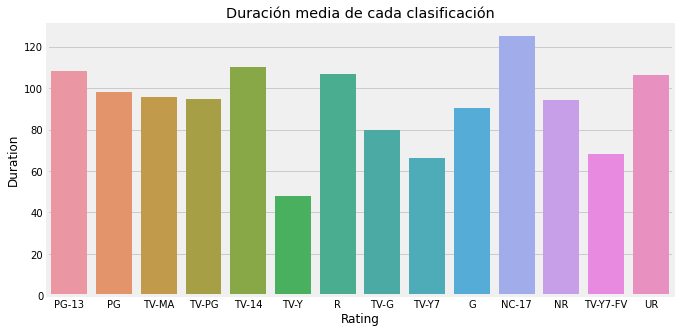

In [17]:
plt.figure(figsize = (10,5))
fig = sns.barplot(data = durbyrating, x = "Rating", y = "Duration")
plt.title("Duración media de cada clasificación")